In [1]:
import os
import numpy as np
from PIL import Image

## Single Image

In [2]:
img = Image.open("./data/photos_no_class/asparagus-g4c4164115_640.jpg")

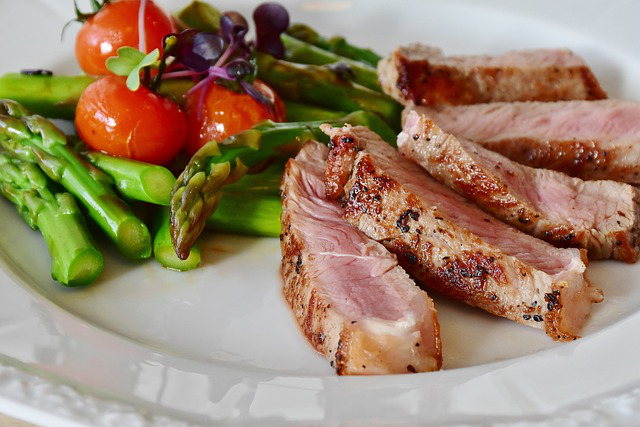

In [3]:
img

In [4]:
small_img = img.resize((224,224))
array = np.asarray(small_img)
array = array*1/255
array = array.flatten()

In [5]:
array

array([0.7372549 , 0.75294118, 0.75686275, ..., 0.71764706, 0.71764706,
       0.7254902 ])

## All Images

In [6]:
data = {'fname':[],'img':np.zeros((80,224*224*3))}

In [7]:
path = "./data/photos_no_class/"
for idx, file in enumerate(os.listdir(path)):
    fname = path+file
    img = Image.open(fname).convert('RGB')
    small_img = img.resize((224,224))
    array = np.asarray(small_img, dtype=np.float32)
    array = array*1/255
    array = array.flatten()
    data['fname'].append(fname)
    data['img'][idx] = array

In [8]:
X = np.array(data['img'])

## Clustering

In [9]:
from sklearn.cluster import KMeans

In [10]:
n_clusters = 5
km = KMeans(n_clusters=n_clusters)

In [11]:
km.fit(X)

C:\Users\pmaldonado\cd\envs\env\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\pmaldonado\cd\envs\env\lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


KMeans(n_clusters=5)

In [12]:
X.shape

(80, 150528)

In [13]:
clusters = km.predict(X)

In [14]:
import matplotlib.pyplot as plt
import matplotlib.image as mp
path = "./data/photos_no_class/"

num_cols = 4
num_rows = n_clusters

fig, axes = plt.subplots(num_rows, num_cols, figsize=(224,224))

from operator import itemgetter
groups = sorted(zip(os.listdir(path)), key=itemgetter(1))

for file, cluster, ax in groups:
    fname = path+file
    img = mp.imread(fname)
    ax.imshow(img)
    ax.set_title('Cluster {}'.format(cluster))
    #axes[row,col].axis('off')
    
plt.show()

In [15]:
for group in groups:
    print(group)

('champon-g31fa88e14_640.jpg', 0, <Axes: title={'center': 'Cluster 0'}>)
('asparagus-g4c4164115_640.jpg', 1, <Axes: title={'center': 'Cluster 1'}>)
('cat-g0052cc4e9_640.jpg', 1, <Axes: title={'center': 'Cluster 1'}>)
('cat-g0fcd844a4_640.jpg', 1, <Axes: title={'center': 'Cluster 1'}>)
('cat-g4fe5d8c20_640.jpg', 1, <Axes: title={'center': 'Cluster 1'}>)
('cat-g6052b543b_640.jpg', 1, <Axes: title={'center': 'Cluster 1'}>)
('cat-gf324dae69_640.jpg', 2, <Axes: title={'center': 'Cluster 2'}>)
('cave-g68bd31d20_640.jpg', 2, <Axes: title={'center': 'Cluster 2'}>)
('dog-g7dcd325a6_640.jpg', 2, <Axes: title={'center': 'Cluster 2'}>)
('beanie-g4c423e47b_640.jpg', 3, <Axes: title={'center': 'Cluster 3'}>)
('bibimbap-gf29abdbf1_640.jpg', 3, <Axes: title={'center': 'Cluster 3'}>)
('cat-g11b1f4535_640.jpg', 3, <Axes: title={'center': 'Cluster 3'}>)
('cat-g4ae5d18aa_640.jpg', 3, <Axes: title={'center': 'Cluster 3'}>)
('cat-ga3a48da6e_640.jpg', 3, <Axes: title={'center': 'Cluster 3'}>)
('chicken-soup-